# Dimensionality reduction for Google's video codec seed

In [1]:
#TODO: remove after development 
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib inline

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle


from fiz_lernmodule import data_reader
from fiz_lernmodule.visualization_landscaping import EmbeddingVisualizer

Using TensorFlow backend.


## Preprocessing data

In [4]:
landscape_reader = data_reader.LandscapeDataReader(src_dir="C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/notebook_data")
patents = landscape_reader.load_data(seed_name='video_codec')

Loading data from C:/Users/tskripnikova/Documents/patent-embedding-visualization\notebook_data/data/video_codec\landscape_data.pkl
Finished loading.


In [5]:
print(patents.shape)
patents.head()

(11628, 11)


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel
0,10074835,US-10074835-B2,-1,0,Battery pack,Disclosed is a battery pack which has a simple...,unused,unused,"JP-2003272974-A,JP-2003272974-A,JP-2003272974-...","H01M2/1077,H01M10/6554,H01M10/6551,H01M2/02,H0...",AntiSeed
1,10074171,US-10074171-B1,-1,0,System and method for automatically measuring ...,"Methods, systems, and computer readable media ...",unused,unused,"US-5038384-A,US-5038384-A,US-5038384-A,US-5038...","G06K9/3216,G06T7/13,G06K9/6202,G06T7/001,G06T2...",AntiSeed
2,10076064,US-10076064-B2,-1,0,Housing having configurable airflow exhaust,A configurable housing includes a top surface ...,unused,unused,"US-2715359-A,US-2715359-A,US-2715359-A,US-2715...","H05K7/20572,Y10T29/49826,H05K7/20554,B23P11/00...",AntiSeed
3,2004017928,US-2004017928-A1,23250971,19990528,Automatic compliance-testing system for deskto...,An automatic compliance testing system for eva...,unused,unused,"US-25773-A,US-281353-A,US-283157-A,US-3304422-...","G06K5/00,G06K5/00,G06K5/00,G06K5/00,G06K5/00,G...",AntiSeed
4,2007128177,US-2007128177-A1,22535598,19990528,Methods and compositions for lowering the leve...,The present invention provides recombinant ade...,unused,unused,"US-5605690-A,US-5605690-A,US-5605690-A,US-5605...","A61K38/00,C07K2319/30,C12N15/86,C12N2750/14143...",AntiSeed


In [6]:
final_layer_train = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/video_codec/train_final_layer_per_doc.csv')
final_layer_test = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/video_codec/test_final_layer_per_doc.csv')

final_layer = pd.concat([final_layer_train, final_layer_test])
final_layer.set_index("Unnamed: 0", inplace=True)
print(final_layer.shape)
final_layer.head()

(11628, 64)


,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
4454,-0.395693,-0.302138,-0.193485,-0.225769,-0.256115,0.509937,0.081442,-0.275732,0.641899,0.488883,...,0.722535,0.540194,0.099262,-0.213459,0.115595,-0.327841,-0.019768,-0.252705,-0.292741,0.092593
6385,-0.241048,-0.163385,-0.116374,-0.167176,-0.181077,0.502844,0.249034,-0.155883,0.252420,0.531091,...,0.320983,0.488076,0.537099,0.400931,0.255055,-0.243024,0.408901,-0.232467,-0.199784,0.049700
8570,1.768094,1.764331,1.111353,1.236753,2.254291,-0.942551,1.567436,1.202993,-0.918645,-0.897050,...,-0.863322,-0.932075,-0.704669,3.729199,-0.424965,1.659519,2.083215,1.283349,1.489882,1.774736
9528,-0.298490,-0.205453,-0.213015,-0.293032,-0.239324,0.509732,0.390958,-0.193722,0.547727,0.608989,...,0.410807,0.409143,0.579383,0.383521,0.558780,-0.274684,0.330476,-0.277074,-0.302672,0.061228
6224,-0.196714,-0.239300,-0.125500,-0.052081,-0.052821,0.599923,0.329549,-0.123008,0.389726,0.552224,...,0.201404,0.263578,0.444778,0.229107,0.743983,-0.198160,0.928901,-0.334845,-0.251334,0.272207


In [7]:
average_word_train = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/video_codec/train_average_word_embedding_per_doc.csv')
average_word_test = pd.read_csv('C:/Users/tskripnikova/Google Drive/FIZ_doc_embeddings/doc_embeddings/video_codec/test_average_word_embedding_per_doc.csv')

average_word = pd.concat([average_word_train, average_word_test])
average_word.set_index("Unnamed: 0", inplace=True)
print(average_word.shape)
average_word.head()

(11628, 300)


,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
4454,-0.075760,-0.118111,0.134053,-0.058104,-0.125253,0.010208,0.050113,0.012232,0.069622,0.111439,...,0.157848,-0.097973,0.116240,-0.046208,-0.029296,0.029657,0.024696,0.181717,-0.052324,-0.105227
6385,-0.059795,-0.099904,0.124313,-0.046674,-0.104647,0.003102,0.040549,0.010690,0.066907,0.105505,...,0.140691,-0.085157,0.166875,-0.043487,-0.024128,0.022995,0.023079,0.149197,-0.044881,-0.092502
8570,-0.066268,-0.105826,0.103932,-0.037892,-0.108048,0.005967,0.040206,0.002227,0.047453,0.096185,...,0.149427,-0.085615,0.147713,-0.037450,-0.023292,0.025545,0.032111,0.148528,-0.046241,-0.093054
9528,-0.073849,-0.109985,0.132679,-0.058085,-0.127186,0.002791,0.044009,0.012626,0.069734,0.105512,...,0.156187,-0.104187,0.157838,-0.051510,-0.037739,0.021285,0.029911,0.182560,-0.060888,-0.102540
6224,-0.065148,-0.099942,0.113002,-0.044656,-0.116282,0.006118,0.043261,0.004274,0.063252,0.099104,...,0.140860,-0.088690,0.122887,-0.049003,-0.022895,0.029368,0.023489,0.162847,-0.051844,-0.100120


In [8]:
from sklearn.manifold import TSNE

params = {}
tsne = TSNE(**params)

## Whole data set (seed and anti-seed)

In [9]:
ev64 = EmbeddingVisualizer(tsne, final_layer, patents)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


### Final layer

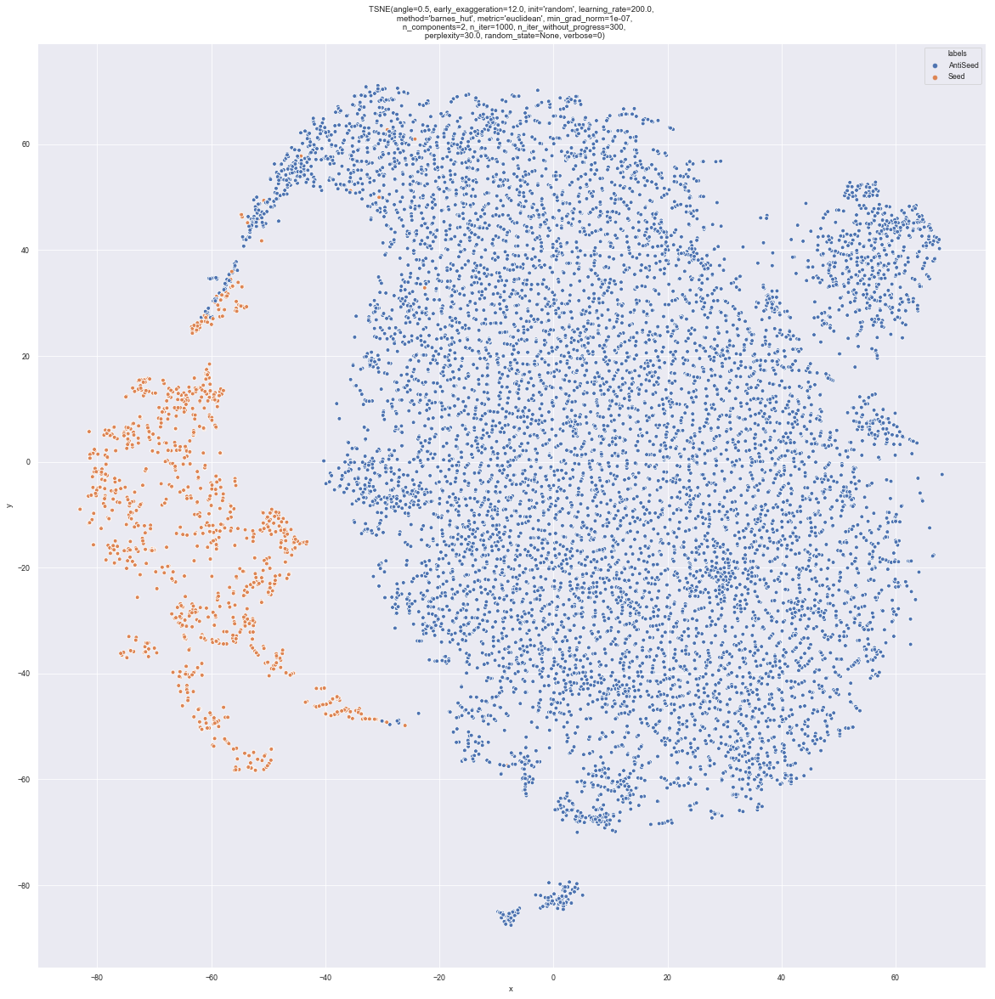

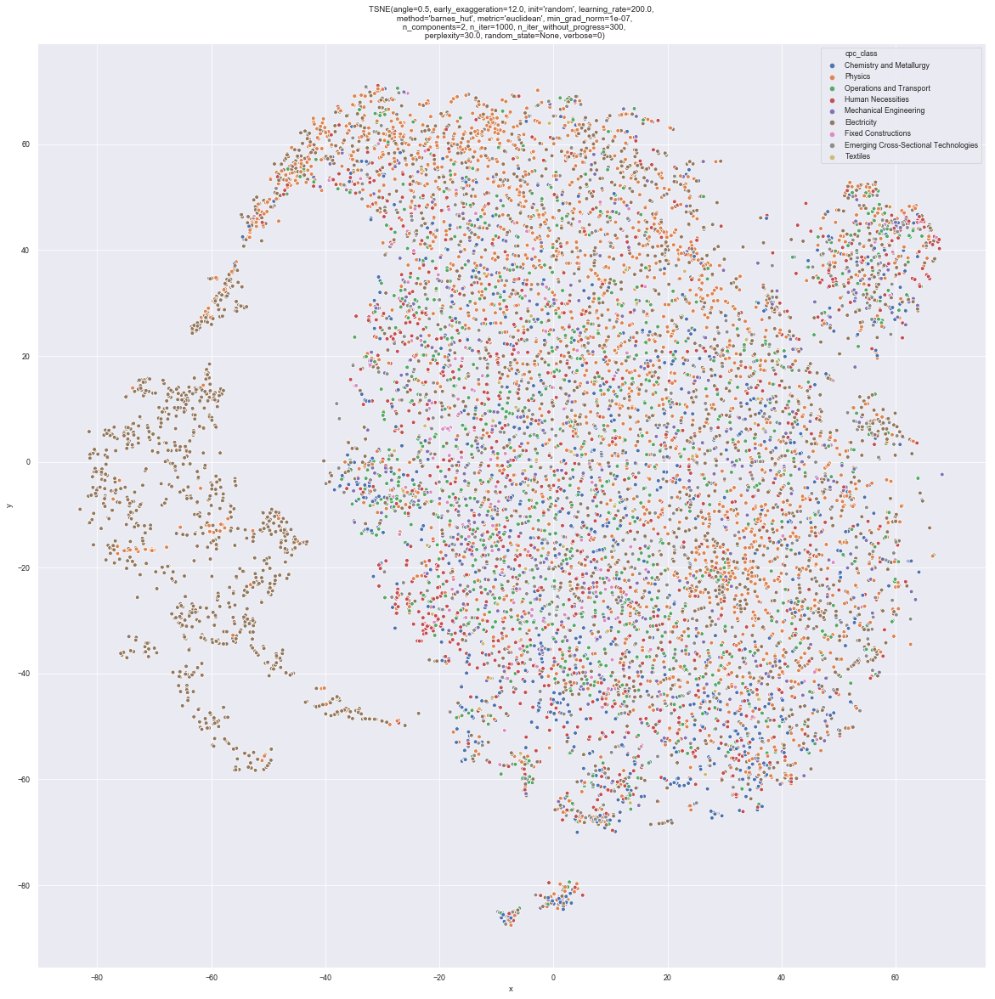

In [10]:
ev64.plot_embeddings(detailed=False, label=False)
ev64.plot_embeddings(detailed=True, label=False)

In [11]:
ev300 = EmbeddingVisualizer(tsne, average_word, patents)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


### Averaged words

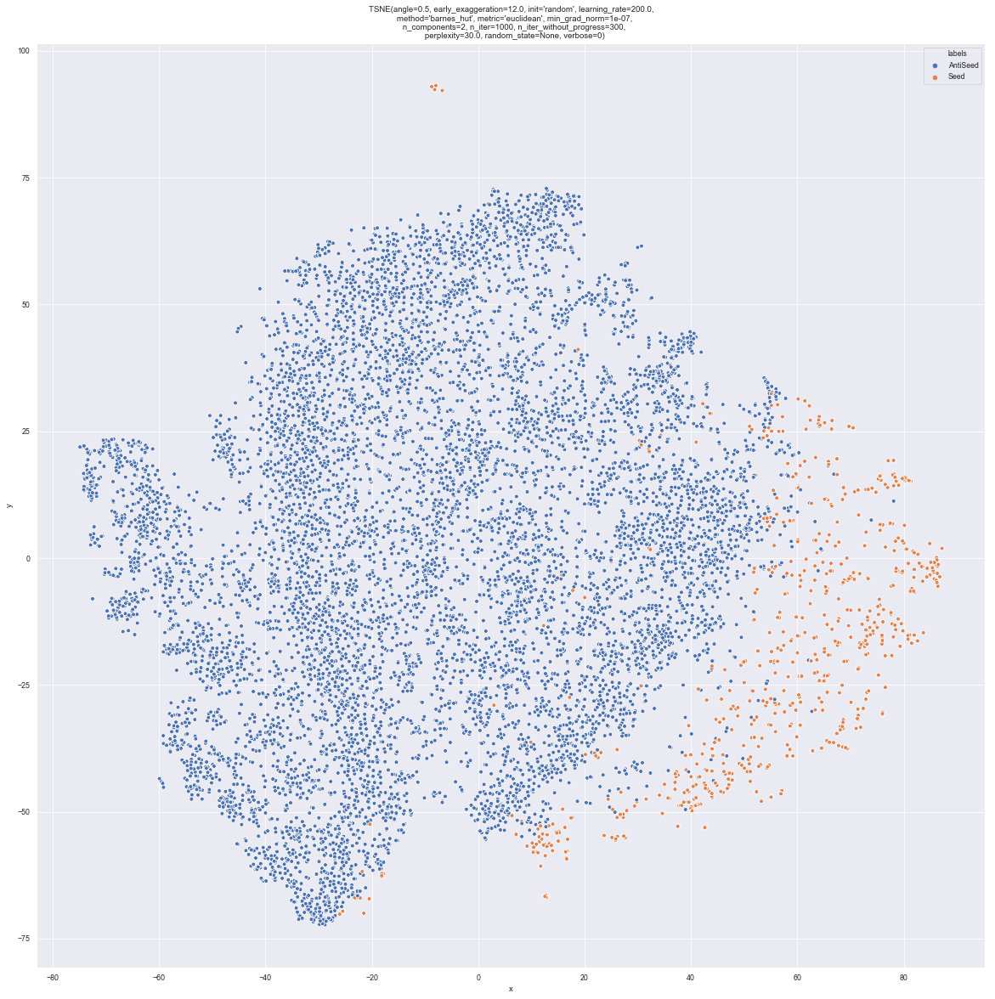

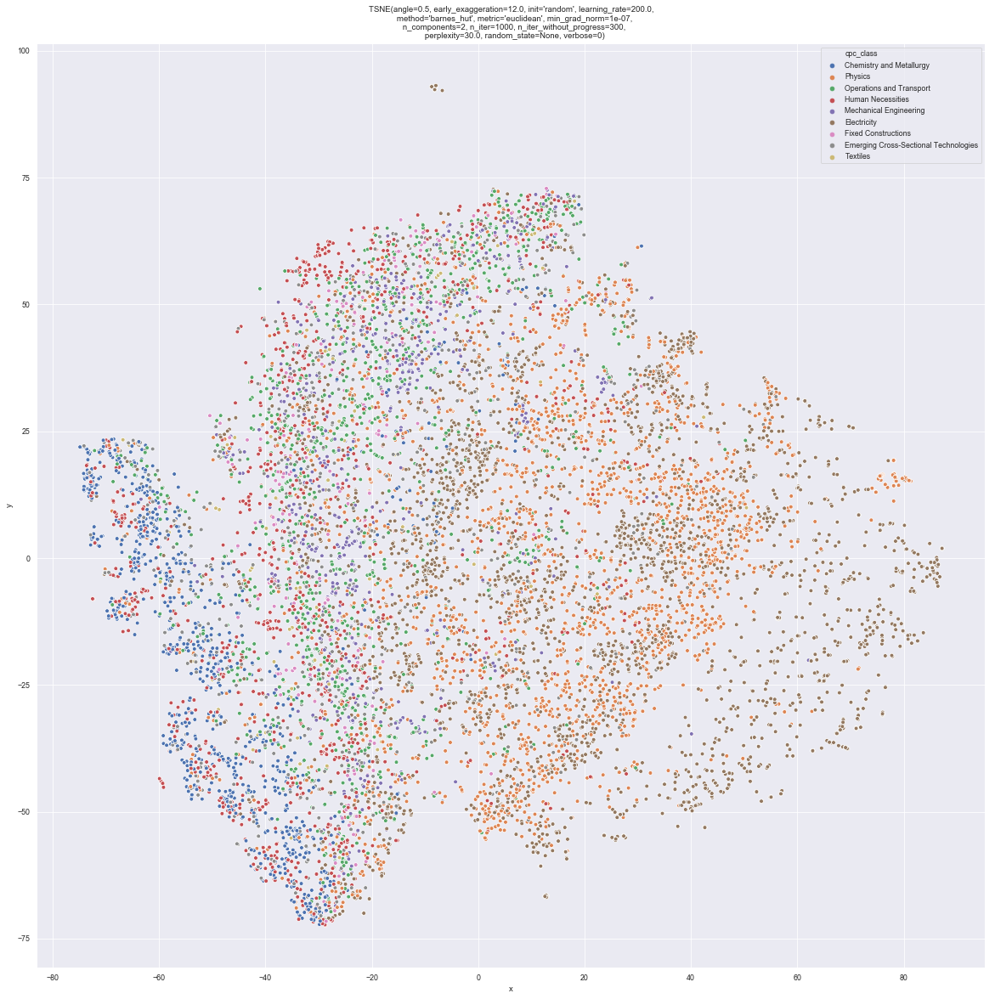

In [12]:
ev300.plot_embeddings(detailed=False, label=False)
ev300.plot_embeddings(detailed=True, label=False)

## Seed only

In [13]:
### Preprocessing of text from abstract to labels with TF-IDF

In [14]:
patents_seed = patents.loc[patents['ExpansionLevel'] == 'Seed']
patents_seed["abstract_prep"] = patents_seed["title_text"].str.cat(patents_seed["abstract_text"], sep=" ")
print(patents_seed.shape)
patents_seed.head()

(1631, 12)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep
40,9497463,US-9497463-B2,48191360,20111104,Method of generating reconstructed block,Provided is a method that derives an intra pre...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/13,H04N19/105,H04N19/11,H04N19/126,H04N...",Seed,Method of generating reconstructed block Provi...
41,8948259,US-8948259-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...
43,9204151,US-9204151-B2,48191357,20111104,Method of deriving quantization parameter with...,Provided is a method that restores a different...,unused,unused,"US-2002054638-A1,US-2002054638-A1,US-200205463...","H04N19/593,H04N19/157,H04N19/11,H04N19/105,H04...",Seed,Method of deriving quantization parameter with...
44,9332263,US-9332263-B2,48191359,20111104,Method of generating quantized block,Provided is a method that derives an intra pre...,unused,unused,"WO-2008130367-A1,WO-2008130367-A1,WO-200813036...","H04N19/176,H04N19/124,H04N19/122,H04N19/11,H04...",Seed,Method of generating quantized block Provided ...
45,9167251,US-9167251-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...


In [15]:
from fiz_lernmodule.preprocessing import PreProcessor

pre = PreProcessor()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\tskripnikova\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [16]:
patents_seed['label'] = patents_seed['abstract_text'].map(lambda patent: pre.preprocess_text(patent).split())
print(patents_seed.shape)
patents_seed.head()

(1631, 13)


C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep,label
40,9497463,US-9497463-B2,48191360,20111104,Method of generating reconstructed block,Provided is a method that derives an intra pre...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/13,H04N19/105,H04N19/11,H04N19/126,H04N...",Seed,Method of generating reconstructed block Provi...,"[provid, deriv, intra, predict, mode, predict,..."
41,8948259,US-8948259-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...,"[provid, construct, mpm, group, includ, three,..."
43,9204151,US-9204151-B2,48191357,20111104,Method of deriving quantization parameter with...,Provided is a method that restores a different...,unused,unused,"US-2002054638-A1,US-2002054638-A1,US-200205463...","H04N19/593,H04N19/157,H04N19/11,H04N19/105,H04...",Seed,Method of deriving quantization parameter with...,"[provid, restor, differenti, quantiz, paramet,..."
44,9332263,US-9332263-B2,48191359,20111104,Method of generating quantized block,Provided is a method that derives an intra pre...,unused,unused,"WO-2008130367-A1,WO-2008130367-A1,WO-200813036...","H04N19/176,H04N19/124,H04N19/122,H04N19/11,H04...",Seed,Method of generating quantized block Provided ...,"[provid, deriv, intra, predict, mode, predict,..."
45,9167251,US-9167251-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...,"[provid, construct, mpm, group, includ, three,..."


In [17]:
import gensim

dictionary = gensim.corpora.Dictionary(patents_seed['label'] )
#dictionary.token2id

C:\Users\tskripnikova\Anaconda3\envs\vis_emb\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [18]:
#Document to Bag-of-word
bow_corpus = [dictionary.doc2bow(doc) for doc in patents_seed['label'] ]

# Preview Bag Of Words for a sample document
bow_doc_0 = bow_corpus[0]
for i in range(len(bow_doc_0)):
    print("Word {} \"{}\" appears {} times.".format(bow_doc_0[i][0], dictionary[bow_doc_0[i][0]], bow_doc_0[i][1]))

Word 0 "accord" appears 3 times.
Word 1 "adapt" appears 1 times.
Word 2 "also" appears 1 times.
Word 3 "amount" appears 1 times.
Word 4 "becom" appears 1 times.
Word 5 "bit" appears 2 times.
Word 6 "block" appears 14 times.
Word 7 "code" appears 1 times.
Word 8 "current" appears 4 times.
Word 9 "decreas" appears 1 times.
Word 10 "deriv" appears 1 times.
Word 11 "determin" appears 1 times.
Word 12 "distanc" appears 1 times.
Word 13 "equal" appears 1 times.
Word 14 "gener" appears 5 times.
Word 15 "group" appears 1 times.
Word 16 "inform" appears 1 times.
Word 17 "intra" appears 6 times.
Word 18 "mode" appears 5 times.
Word 19 "mpm" appears 1 times.
Word 20 "neighbor" appears 1 times.
Word 21 "origin" appears 1 times.
Word 22 "predict" appears 11 times.
Word 23 "provid" appears 1 times.
Word 24 "reconstruct" appears 1 times.
Word 25 "reduc" appears 1 times.
Word 26 "requir" appears 1 times.
Word 27 "residu" appears 4 times.
Word 28 "set" appears 1 times.
Word 29 "short" appears 1 times.


In [19]:
#creating TfidfModel 
from pprint import pprint

tfidf = gensim.models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.1309708738022665),
 (1, 0.0800535237958707),
 (2, 0.07863812498044295),
 (3, 0.09120440005167027),
 (4, 0.16556561090714134),
 (5, 0.12046282984471572),
 (6, 0.35897319810414763),
 (7, 0.019466485132629958),
 (8, 0.14220965537911245),
 (9, 0.1305844438607872),
 (10, 0.07863812498044295),
 (11, 0.03226923923104228),
 (12, 0.1021241829000689),
 (13, 0.09521258196871199),
 (14, 0.1950670203927366),
 (15, 0.09296403173802666),
 (16, 0.027856485270222026),
 (17, 0.44356899619283563),
 (18, 0.2568191727584181),
 (19, 0.1261855670980244),
 (20, 0.07641055743943868),
 (21, 0.1041149079938262),
 (22, 0.2844609337197853),
 (23, 0.04588675486283697),
 (24, 0.07957469927739629),
 (25, 0.0723746271716746),
 (26, 0.12142429269874495),
 (27, 0.30564222975775474),
 (28, 0.07294835855754776),
 (29, 0.16221080244893205),
 (30, 0.09892460127584363),
 (31, 0.1305844438607872),
 (32, 0.30478455027588147),
 (33, 0.1016453583815945),
 (34, 0.10954623807523672),
 (35, 0.07415826301432413),
 (36, 0.0452

In [20]:
from operator import itemgetter

for i, doc in enumerate(corpus_tfidf):
    doc.sort(key=itemgetter(1), reverse=True)
    sorted_words = []
    for word_id, relevance in doc:
        sorted_words.append(dictionary[word_id])
        #print(dictionary[word_id] + " " + str(word_id) + " " + str(relevance)) 
    patents_seed.iat[i, 12] = sorted_words # replace label with a sorted list
    
patents_seed.head()

,pub_num,publication_number,family_id,priority_date,title_text,abstract_text,claims_text,description_text,refs,cpcs,ExpansionLevel,abstract_prep,label
40,9497463,US-9497463-B2,48191360,20111104,Method of generating reconstructed block,Provided is a method that derives an intra pre...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/13,H04N19/105,H04N19/11,H04N19/126,H04N...",Seed,Method of generating reconstructed block Provi...,"[intra, block, residu, size, predict, mode, ge..."
41,8948259,US-8948259-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...,"[group, mpm, mode, intra, predict, three, indi..."
43,9204151,US-9204151-B2,48191357,20111104,Method of deriving quantization parameter with...,Provided is a method that restores a different...,unused,unused,"US-2002054638-A1,US-2002054638-A1,US-200205463...","H04N19/593,H04N19/157,H04N19/11,H04N19/105,H04...",Seed,Method of deriving quantization parameter with...,"[quantiz, paramet, minimum, per, adjust, size,..."
44,9332263,US-9332263-B2,48191359,20111104,Method of generating quantized block,Provided is a method that derives an intra pre...,unused,unused,"WO-2008130367-A1,WO-2008130367-A1,WO-200813036...","H04N19/176,H04N19/124,H04N19/122,H04N19/11,H04...",Seed,Method of generating quantized block Provided ...,"[scan, pattern, invers, intra, subset, size, t..."
45,9167251,US-9167251-B2,48191356,20111104,Method and apparatus of deriving intra predict...,Provided is a method that constructs an MPM gr...,unused,unused,"US-2003223495-A1,US-2003223495-A1,US-200322349...","H04N19/124,H04N19/625,H04N19/122,H04N19/172,H0...",Seed,Method and apparatus of deriving intra predict...,"[group, mpm, mode, intra, predict, three, indi..."


In [21]:
final_layer_seed = final_layer.merge(patents_seed, left_index=True, right_index=True)
final_layer_seed = final_layer_seed.loc[final_layer_seed['ExpansionLevel'] == 'Seed']
final_layer_seed.drop(final_layer_seed.columns[64:], axis=1, inplace=True)
print(final_layer_seed.shape)
final_layer_seed.head()

(1631, 64)


,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
8570,1.768094,1.764331,1.111353,1.236753,2.254291,-0.942551,1.567436,1.202993,-0.918645,-0.897050,...,-0.863322,-0.932075,-0.704669,3.729199,-0.424965,1.659519,2.083215,1.283349,1.489882,1.774736
5681,2.027991,2.031787,1.266281,1.605298,2.235128,-0.950581,1.008101,1.548005,-0.944854,-0.914664,...,-0.863867,-0.919727,-0.834793,3.007293,-0.633205,1.878085,2.088064,1.531077,1.724947,0.916867
717,1.698971,1.727062,1.221165,1.529481,2.185150,-0.941297,0.822519,1.473959,-0.893515,-0.847615,...,-0.840261,-0.893711,-0.750579,2.400092,-0.703797,1.564892,1.855386,1.286353,1.527708,0.757473
9247,1.369779,1.492593,1.186625,0.922291,2.107099,-0.925932,1.554225,1.064355,-0.901313,-0.819872,...,-0.848662,-0.889231,-0.713503,2.917846,-0.284012,1.330899,2.144505,1.220721,1.138866,1.196011
4422,0.540427,0.667977,0.493107,0.525221,0.586429,-0.273111,0.255023,0.490932,-0.642817,-0.307706,...,-0.455011,-0.248623,-0.251231,0.867166,-0.169628,0.411395,0.343007,0.604530,0.592709,0.116089


In [22]:
average_word_seed = average_word.merge(patents_seed, left_index=True, right_index=True)
average_word_seed = average_word_seed.loc[average_word_seed['ExpansionLevel'] == 'Seed']
average_word_seed.drop(average_word_seed.columns[300:], axis=1, inplace=True)
print(average_word_seed.shape)
average_word_seed.head()

(1631, 300)


,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
8570,-0.066268,-0.105826,0.103932,-0.037892,-0.108048,0.005967,0.040206,0.002227,0.047453,0.096185,...,0.149427,-0.085615,0.147713,-0.037450,-0.023292,0.025545,0.032111,0.148528,-0.046241,-0.093054
5681,-0.054844,-0.104189,0.089810,-0.005455,-0.087773,0.009736,0.029560,0.002142,0.062483,0.101922,...,0.124236,-0.091739,0.157582,-0.039230,-0.038912,0.012310,0.033553,0.134986,-0.031067,-0.072165
717,-0.066303,-0.104915,0.105883,-0.032073,-0.100811,0.000898,0.036555,0.004951,0.059530,0.097239,...,0.136241,-0.091634,0.163003,-0.050951,-0.032066,0.024310,0.022143,0.143813,-0.042663,-0.079935
9247,-0.058145,-0.085196,0.090676,-0.030890,-0.087247,0.005867,0.033994,0.011102,0.060373,0.069650,...,0.113902,-0.066426,0.148317,-0.034108,-0.029434,0.014982,0.022860,0.116389,-0.036725,-0.088388
4422,-0.050780,-0.070625,0.078721,-0.019335,-0.054062,-0.000117,0.021720,0.004431,0.033873,0.052599,...,0.095007,-0.032355,0.174915,-0.042275,-0.014171,0.027011,0.023380,0.075310,-0.028087,-0.060008


#### TSNE

In [23]:
ev64_tsne = EmbeddingVisualizer(tsne, final_layer_seed, patents_seed)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


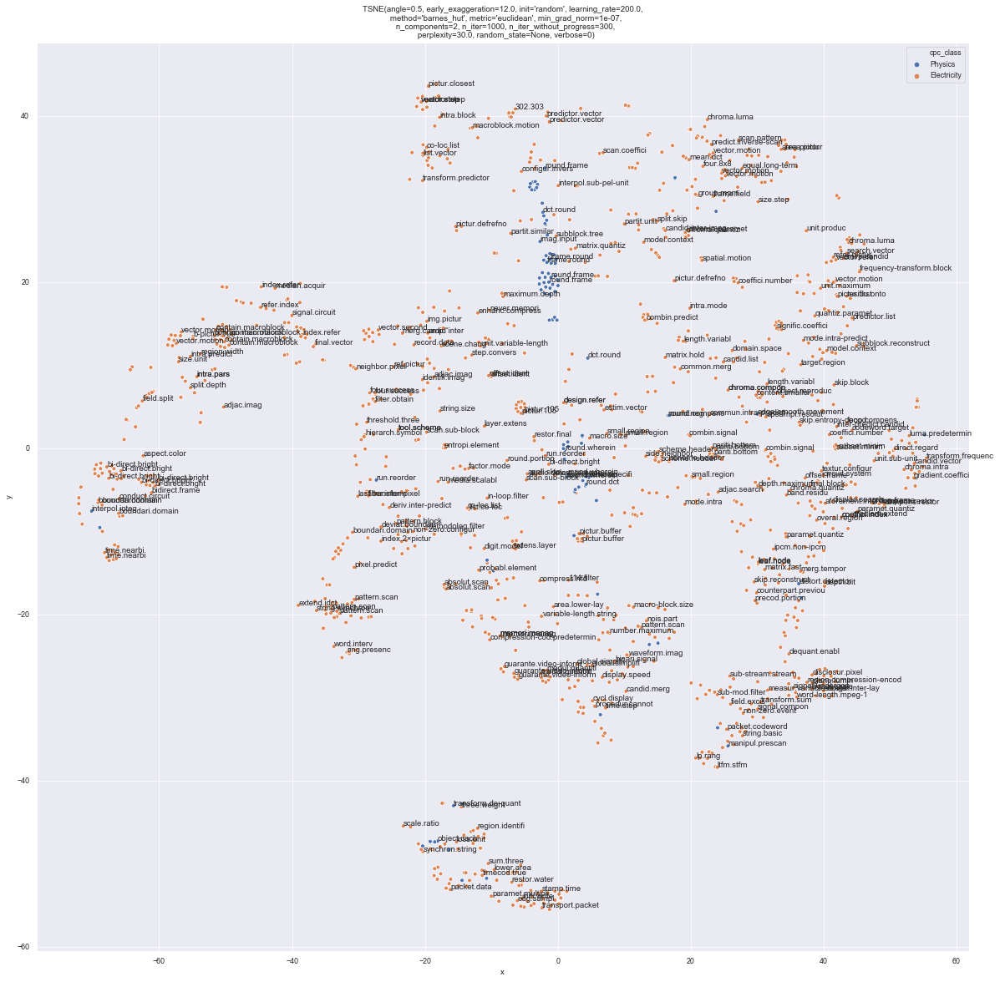

In [24]:
ev64_tsne.plot_embeddings(detailed=True, terms=2)

In [25]:
ev300_tsne = EmbeddingVisualizer(tsne, average_word_seed, patents_seed)

Fit  TSNE(angle=0.5, early_exaggeration=12.0, init='random', learning_rate=200.0,
   method='barnes_hut', metric='euclidean', min_grad_norm=1e-07,
   n_components=2, n_iter=1000, n_iter_without_progress=300,
   perplexity=30.0, random_state=None, verbose=0)
EmbeddingVisualizer initialized


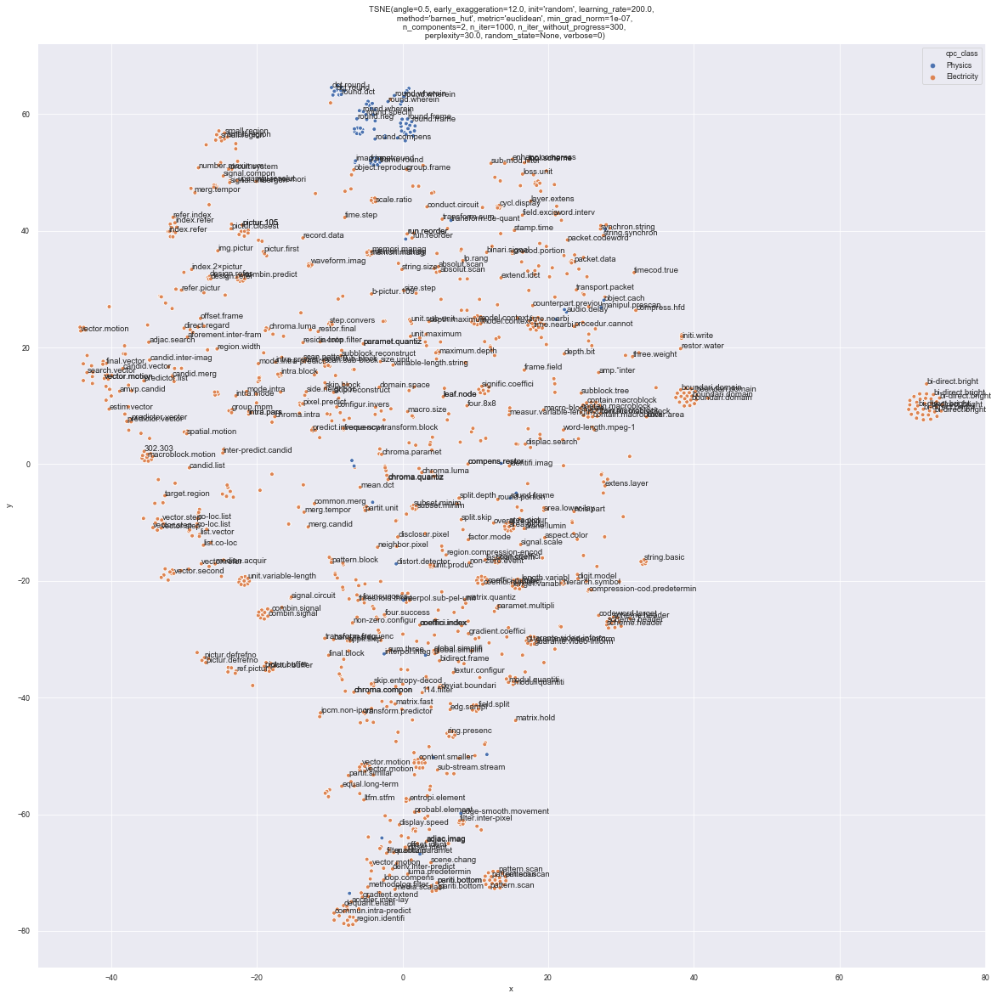

In [26]:
ev300_tsne.plot_embeddings(detailed=True, terms=2)

#### Metric MDS

In [27]:
from sklearn.manifold import MDS

mds = MDS()

In [28]:
ev64_mds = EmbeddingVisualizer(mds, final_layer_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=True,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


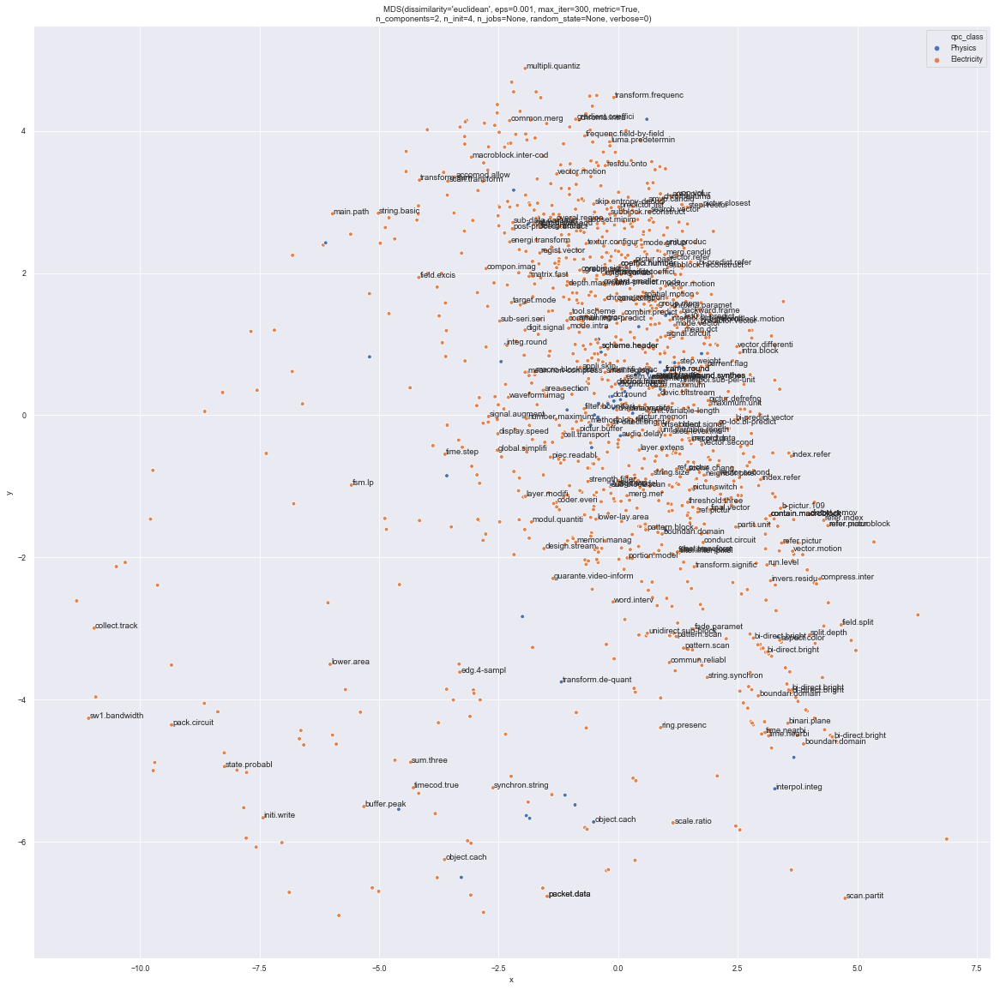

In [74]:
ev64_mds.plot_embeddings(detailed=True, terms=2, density=7)

In [30]:
ev300_mds = EmbeddingVisualizer(mds, average_word_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=True,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


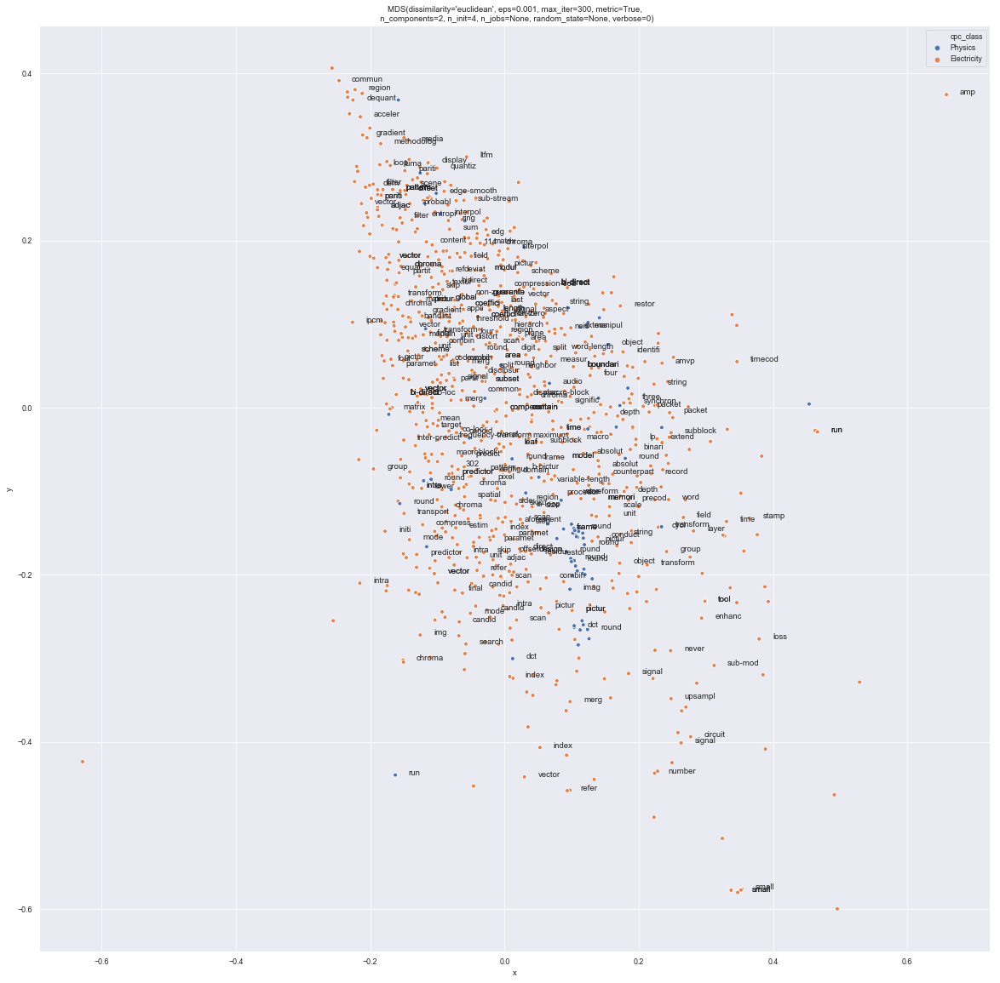

In [31]:
ev300_mds.plot_embeddings(detailed=True)

#### Non-metric MDS

In [32]:
from sklearn.manifold import MDS

nmds = MDS(metric=False)

In [33]:
ev64_nmds = EmbeddingVisualizer(nmds, final_layer_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=False,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


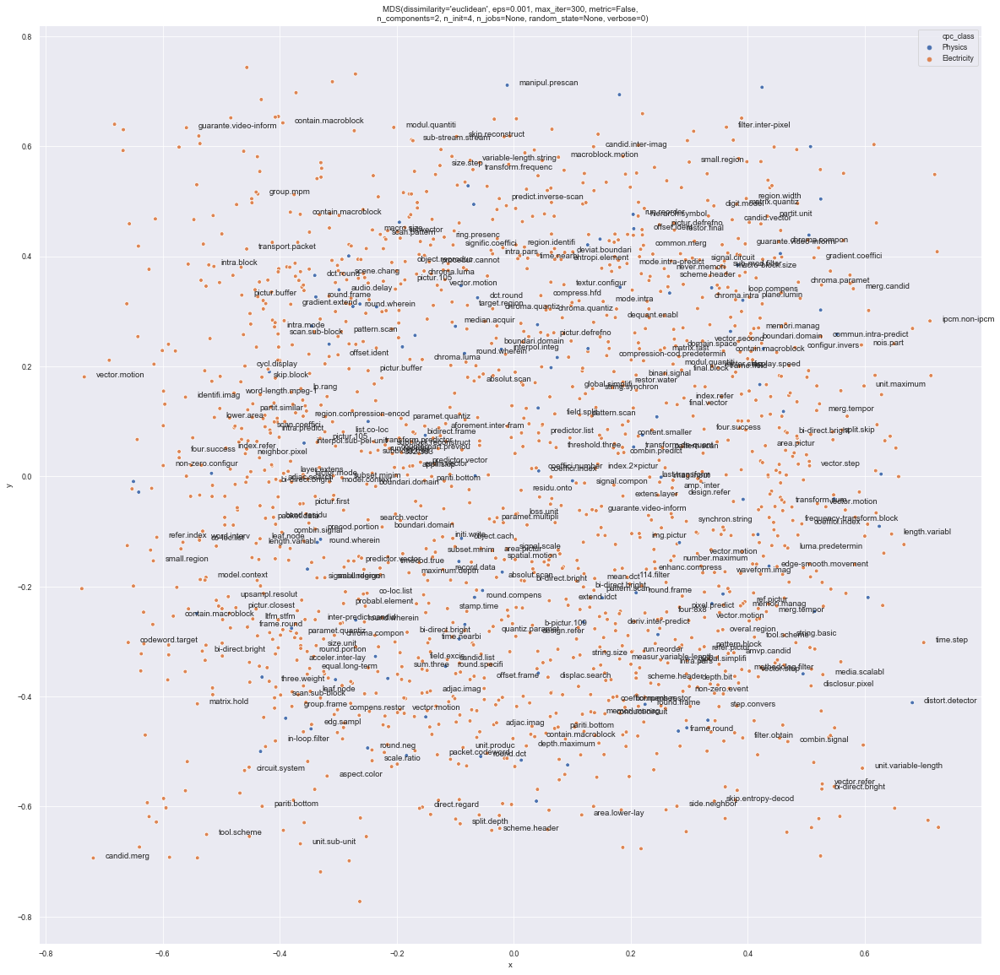

In [75]:
ev64_nmds.plot_embeddings(detailed=True, terms=2)

In [35]:
ev300_nmds = EmbeddingVisualizer(nmds, average_word_seed, patents_seed)

Fit  MDS(dissimilarity='euclidean', eps=0.001, max_iter=300, metric=False,
  n_components=2, n_init=4, n_jobs=None, random_state=None, verbose=0)
EmbeddingVisualizer initialized


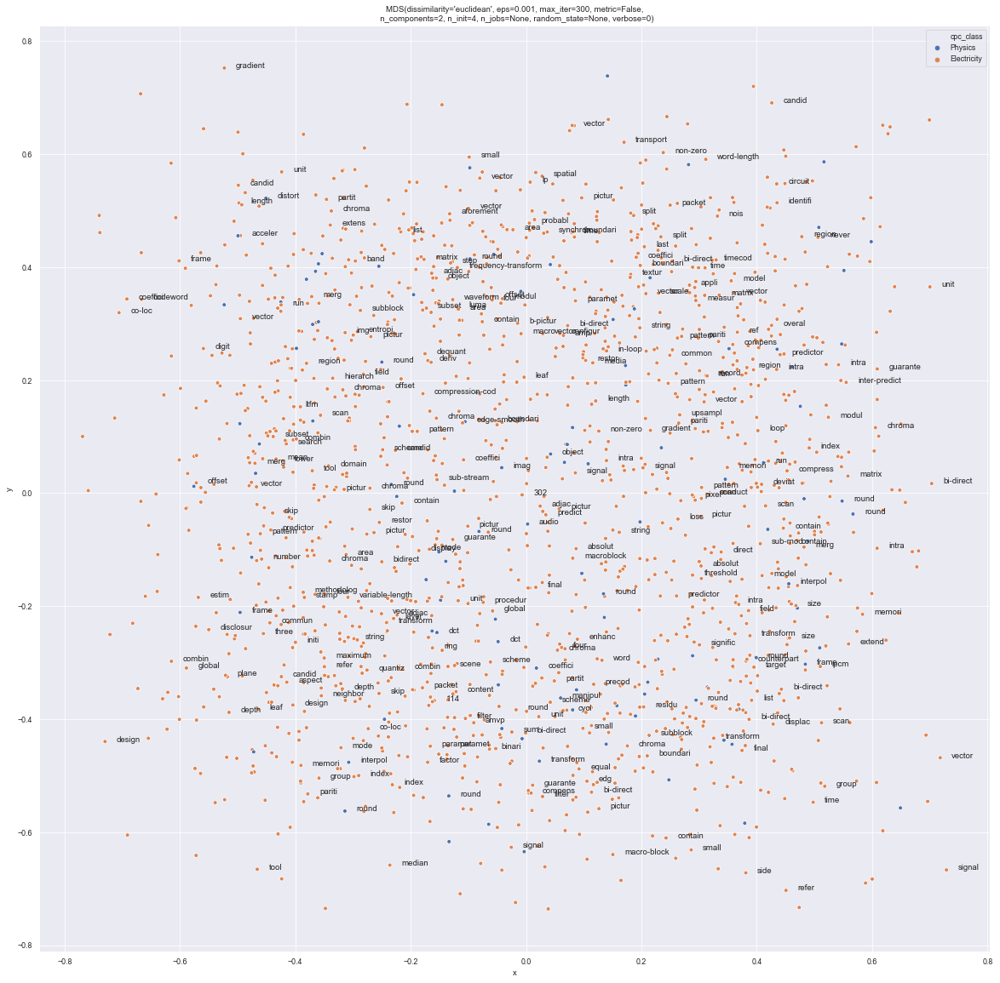

In [36]:
ev300_nmds.plot_embeddings(detailed=True)

#### LocallyLinearEmbedding

In [37]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding()

In [38]:
ev64_lle = EmbeddingVisualizer(lle, final_layer_seed, patents_seed)

Fit  LocallyLinearEmbedding(eigen_solver='auto', hessian_tol=0.0001, max_iter=100,
            method='standard', modified_tol=1e-12, n_components=2,
            n_jobs=None, n_neighbors=5, neighbors_algorithm='auto',
            random_state=None, reg=0.001, tol=1e-06)
EmbeddingVisualizer initialized


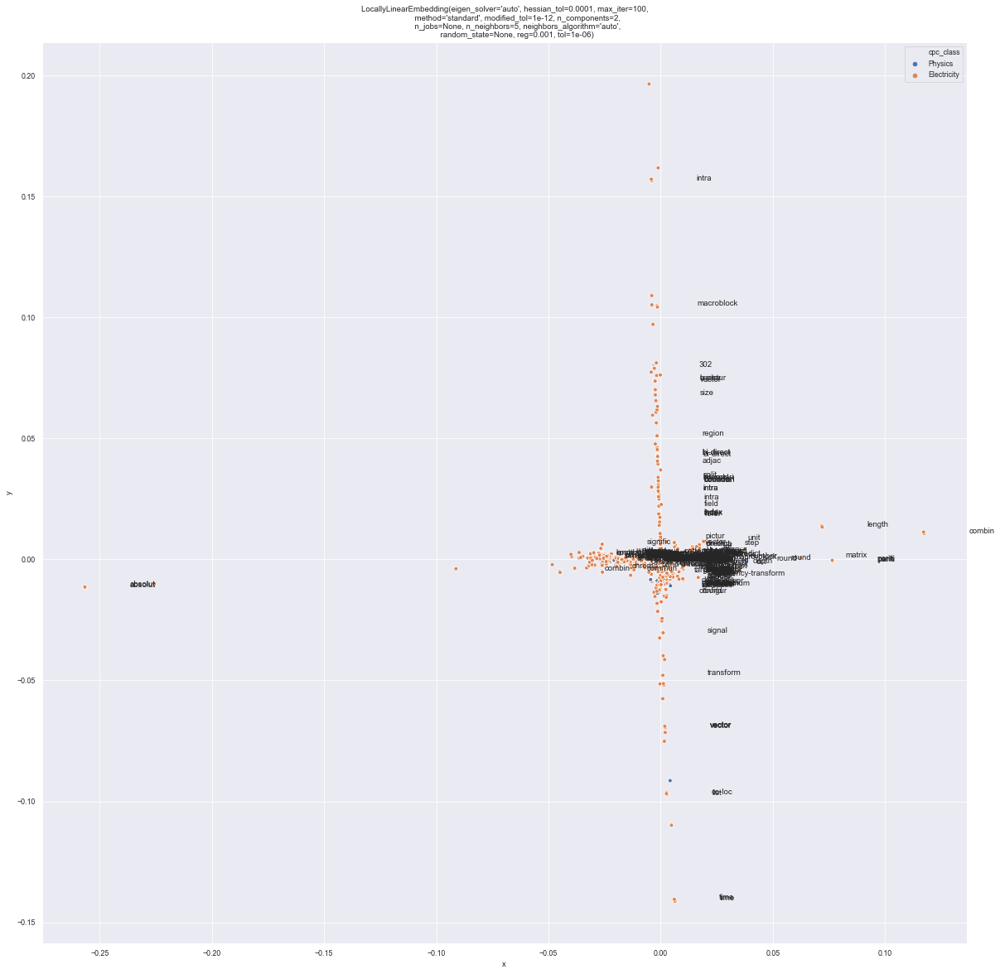

In [39]:
ev64_lle.plot_embeddings(detailed=True)

In [40]:
ev300_lle = EmbeddingVisualizer(lle, average_word_seed, patents_seed)

Fit  LocallyLinearEmbedding(eigen_solver='auto', hessian_tol=0.0001, max_iter=100,
            method='standard', modified_tol=1e-12, n_components=2,
            n_jobs=None, n_neighbors=5, neighbors_algorithm='auto',
            random_state=None, reg=0.001, tol=1e-06)
EmbeddingVisualizer initialized


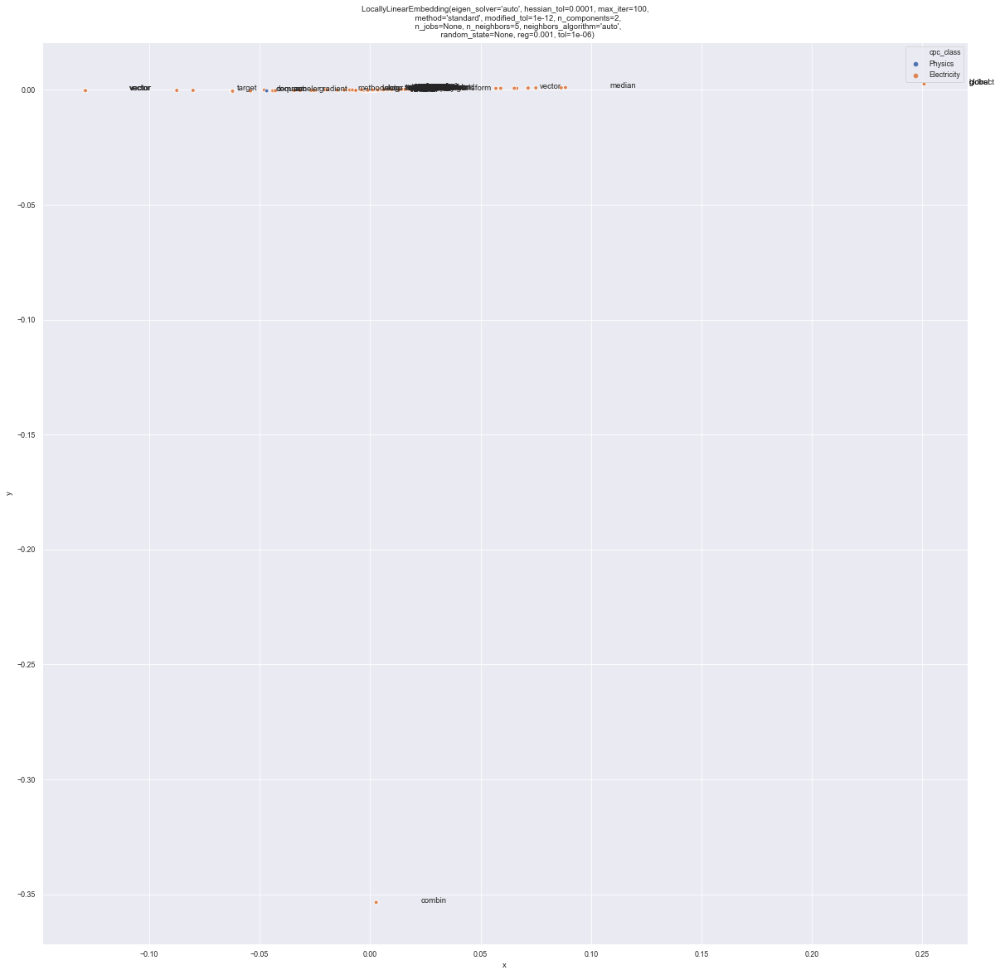

In [41]:
ev300_lle.plot_embeddings(detailed=True)

#### SpectralEmbedding

In [42]:
from sklearn.manifold import SpectralEmbedding

spectral = SpectralEmbedding()

In [43]:
ev64_spectral = EmbeddingVisualizer(spectral, final_layer_seed, patents_seed)

Fit  SpectralEmbedding(affinity='nearest_neighbors', eigen_solver=None, gamma=None,
         n_components=2, n_jobs=None, n_neighbors=None, random_state=None)
EmbeddingVisualizer initialized


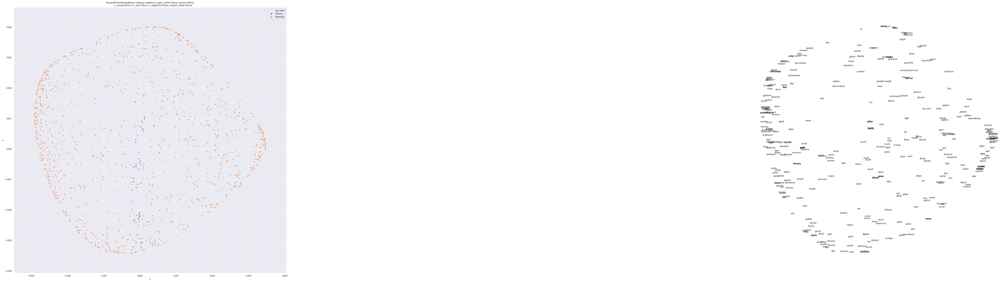

In [44]:
ev64_spectral.plot_embeddings(detailed=True)

In [45]:
ev300_spectral = EmbeddingVisualizer(spectral, average_word_seed, patents_seed)

Fit  SpectralEmbedding(affinity='nearest_neighbors', eigen_solver=None, gamma=None,
         n_components=2, n_jobs=None, n_neighbors=None, random_state=None)
EmbeddingVisualizer initialized


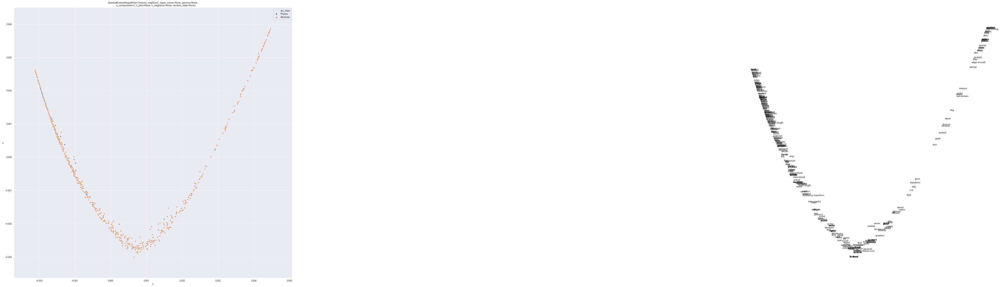

In [46]:
ev300_spectral.plot_embeddings(detailed=True)

#### Isomap

In [47]:
from sklearn.manifold import Isomap

isomap = Isomap()

In [48]:
ev64_isomap = EmbeddingVisualizer(isomap, final_layer_seed, patents_seed)

Fit  Isomap(eigen_solver='auto', max_iter=None, n_components=2, n_jobs=None,
    n_neighbors=5, neighbors_algorithm='auto', path_method='auto', tol=0)
EmbeddingVisualizer initialized


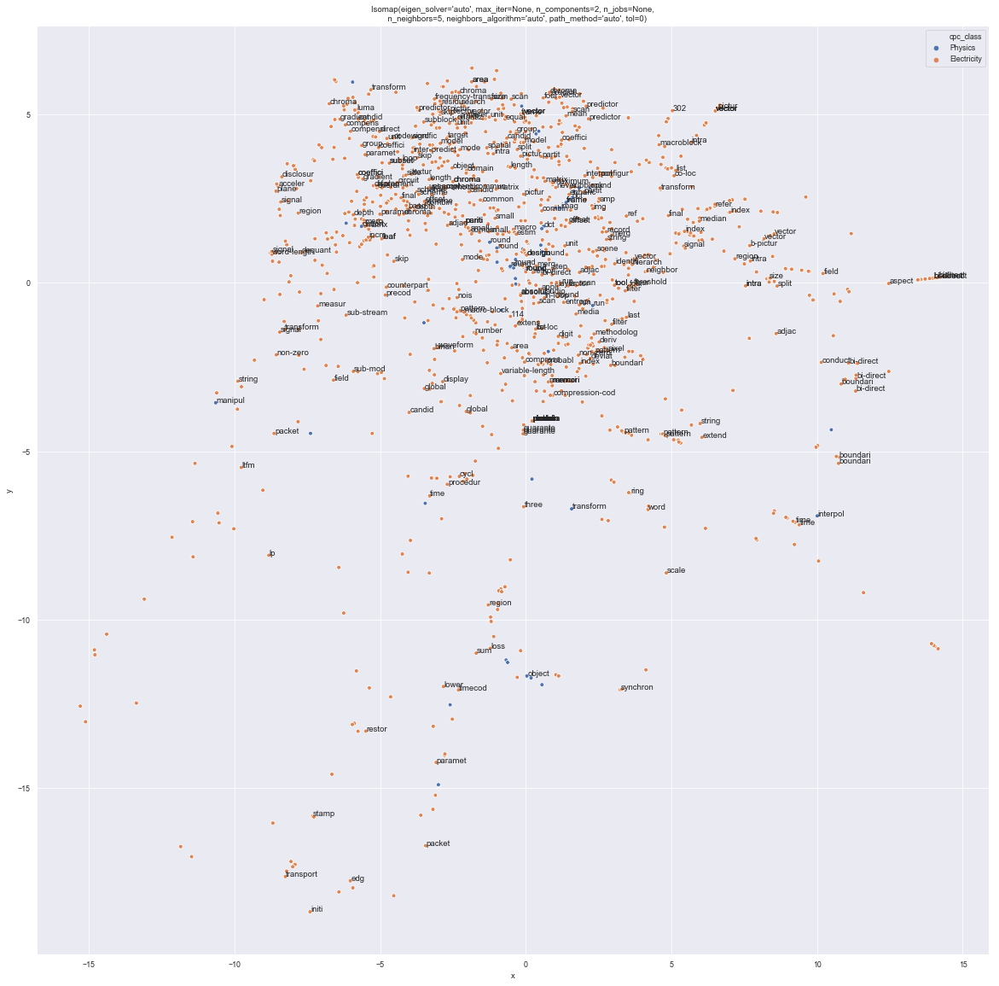

In [49]:
ev64_isomap.plot_embeddings(detailed=True)

In [50]:
ev300_isomap = EmbeddingVisualizer(isomap, average_word_seed, patents_seed)

Fit  Isomap(eigen_solver='auto', max_iter=None, n_components=2, n_jobs=None,
    n_neighbors=5, neighbors_algorithm='auto', path_method='auto', tol=0)
EmbeddingVisualizer initialized


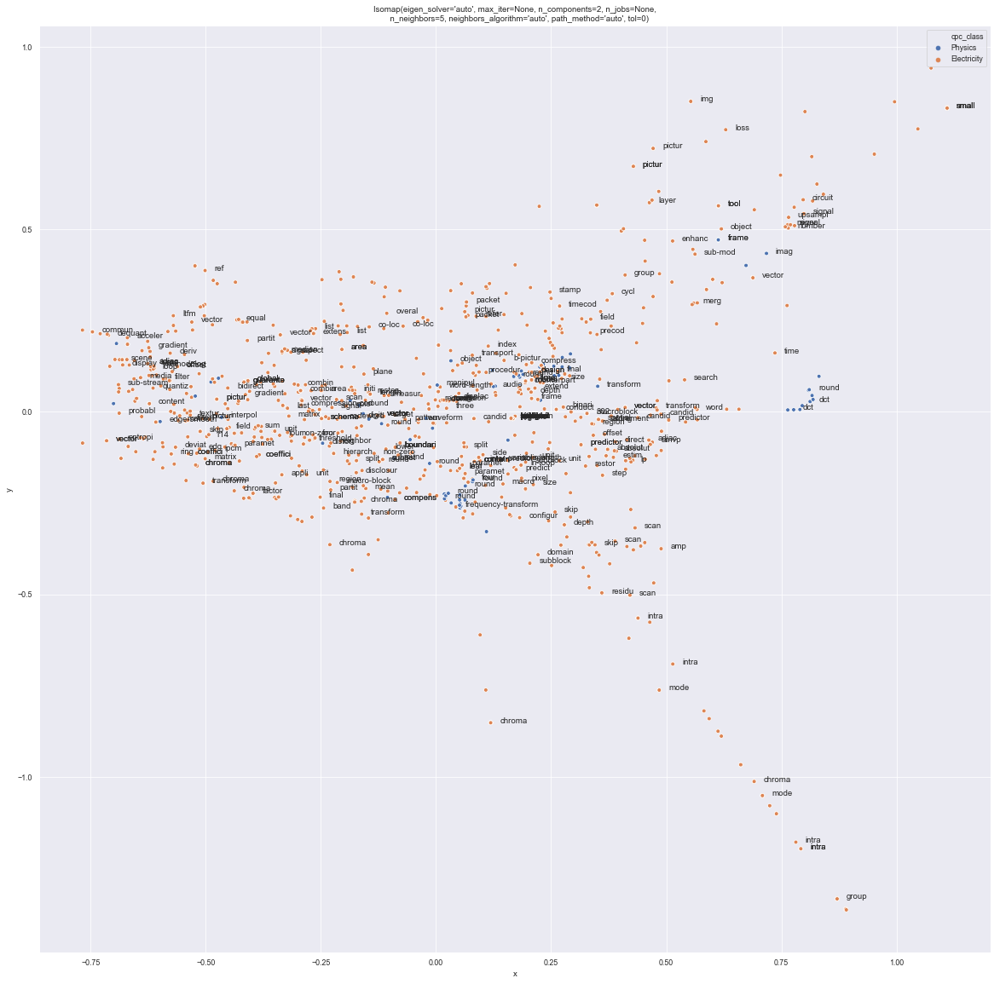

In [51]:
ev300_isomap.plot_embeddings(detailed=True)

#### PCA

In [52]:
from sklearn.decomposition import PCA

pca = PCA()

In [53]:
ev64_pca = EmbeddingVisualizer(pca, final_layer_seed, patents_seed)

Fit  PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
EmbeddingVisualizer initialized


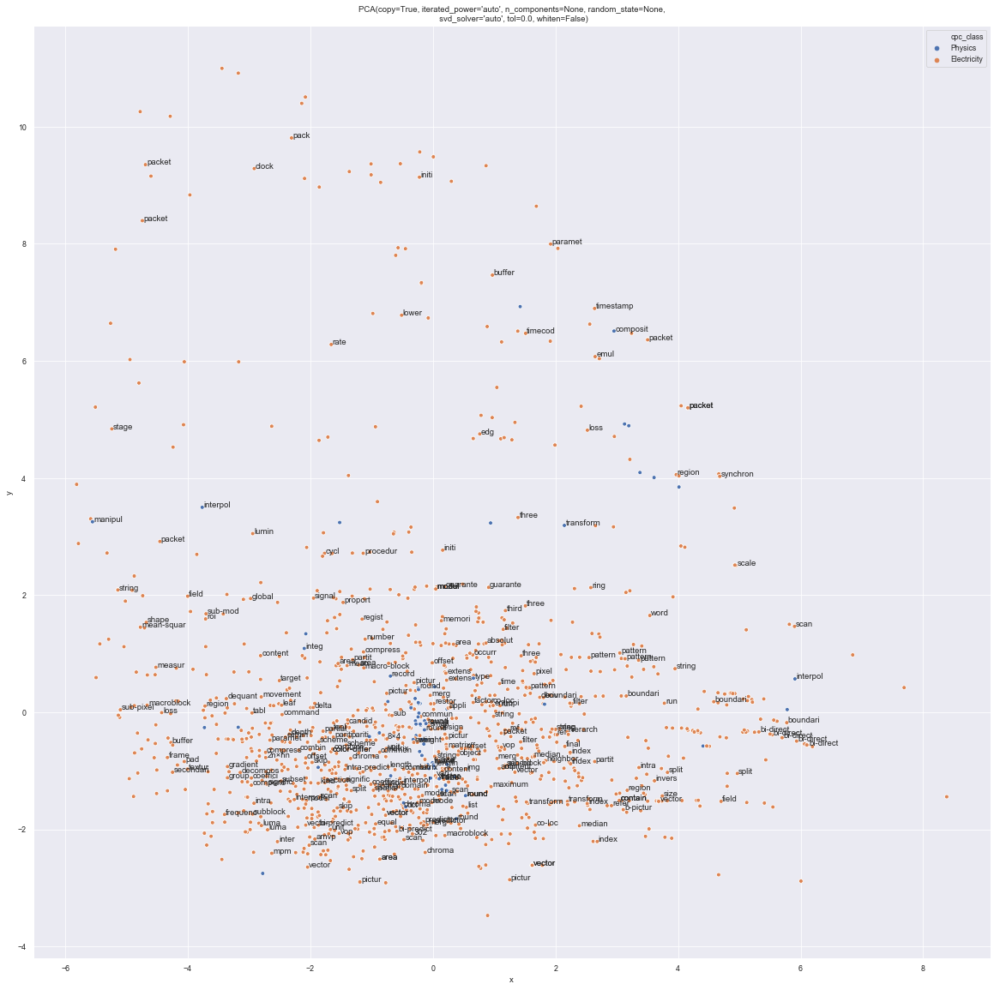

In [76]:
ev64_pca.plot_embeddings(detailed=True, density=6)

In [55]:
ev300_pca = EmbeddingVisualizer(pca, average_word_seed, patents_seed)

Fit  PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)
EmbeddingVisualizer initialized


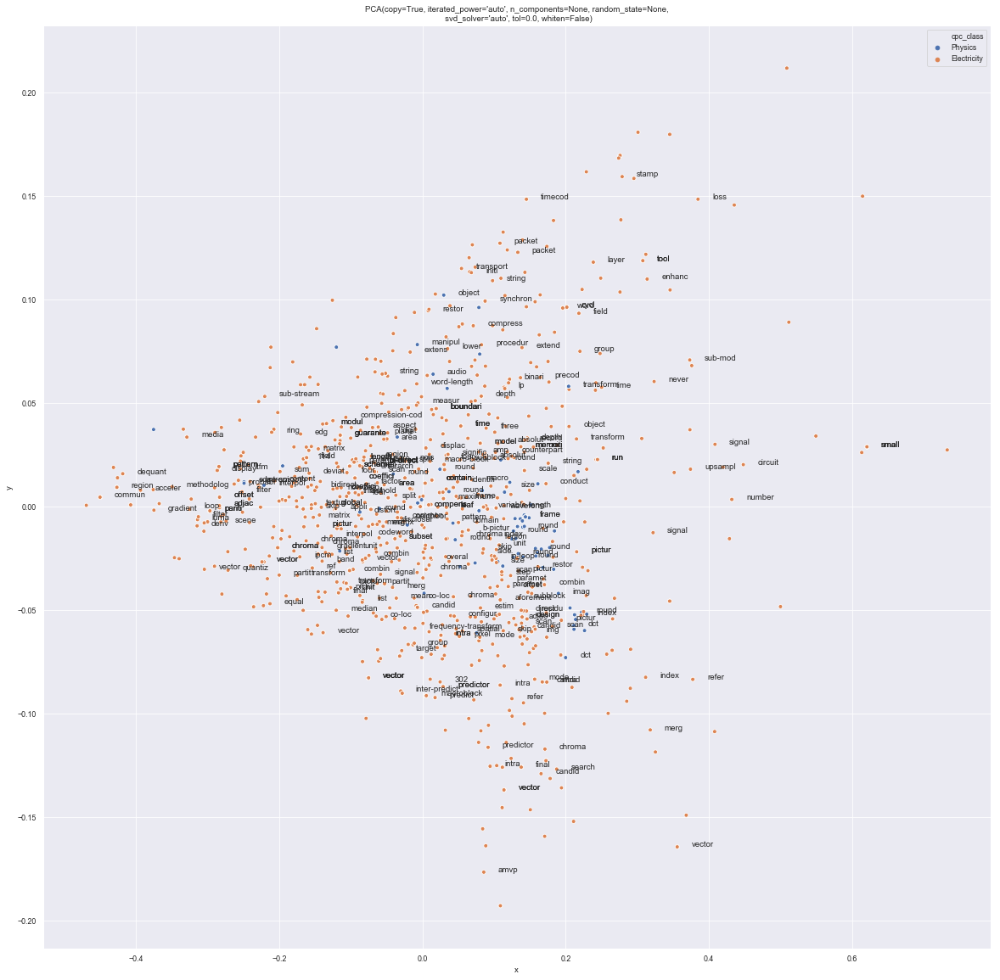

In [56]:
ev300_pca.plot_embeddings(detailed=True)

#### Cosine Kernel PCA

In [57]:
from sklearn.decomposition import KernelPCA

cosine_pca = KernelPCA(kernel='cosine')

In [58]:
ev64_cosine_pca = EmbeddingVisualizer(cosine_pca, final_layer_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


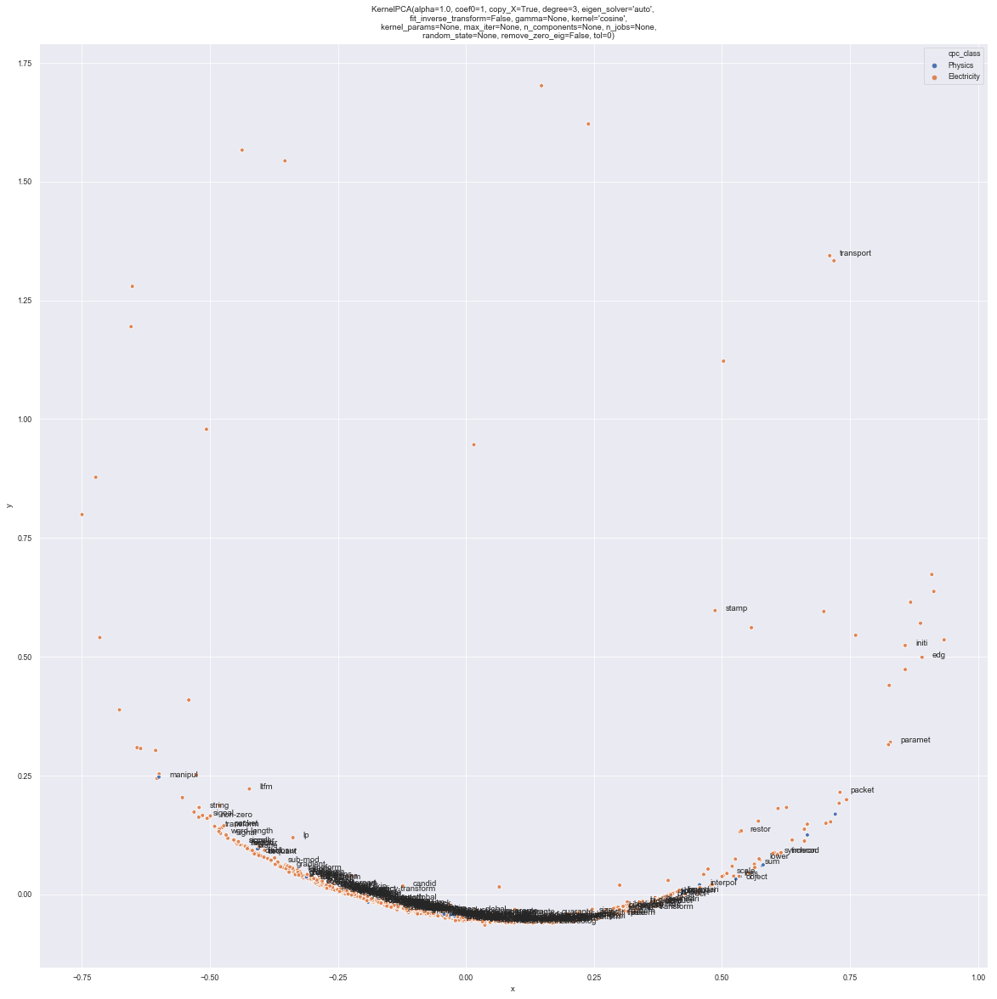

In [59]:
ev64_cosine_pca.plot_embeddings(detailed=True)

In [60]:
ev300_cosine_pca = EmbeddingVisualizer(cosine_pca, average_word_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='cosine',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


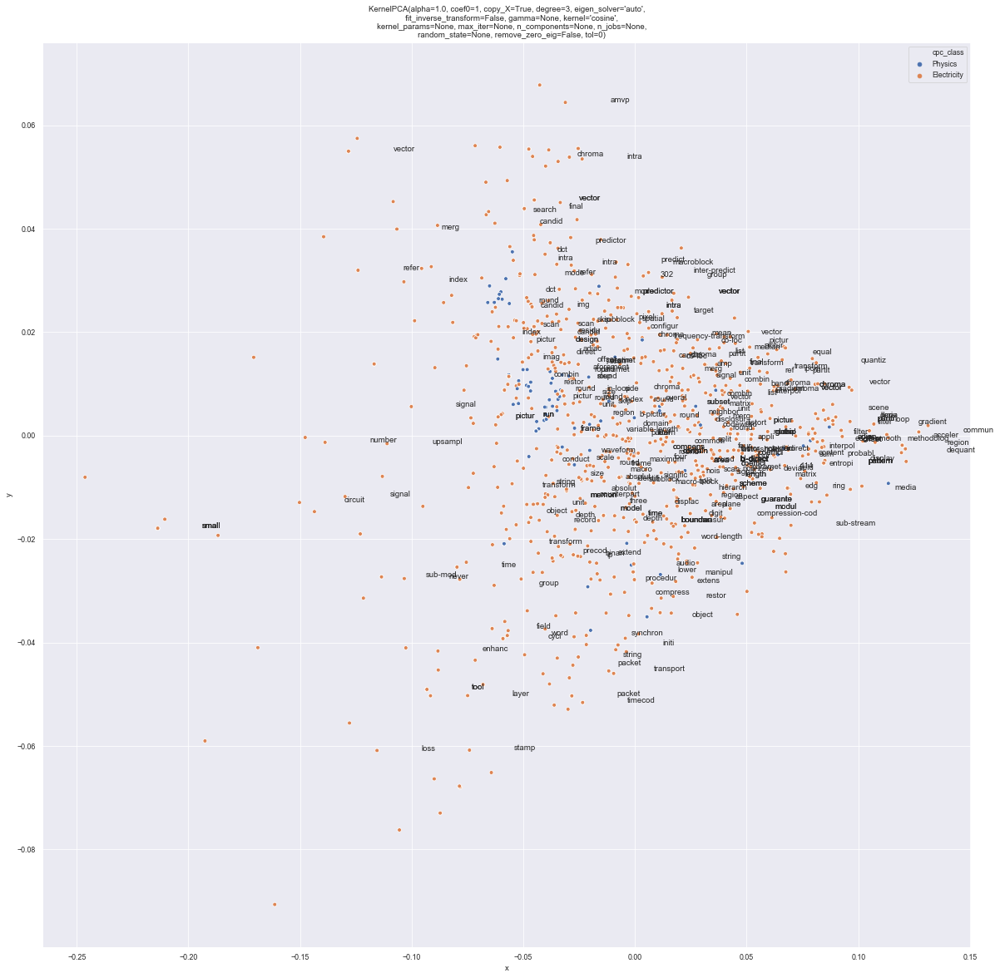

In [61]:
ev300_cosine_pca.plot_embeddings(detailed=True)

#### Polynomial Kernel PCA

In [62]:
poly_pca = KernelPCA(kernel='poly')

In [63]:
ev64_poly_pca = EmbeddingVisualizer(poly_pca, final_layer_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='poly',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


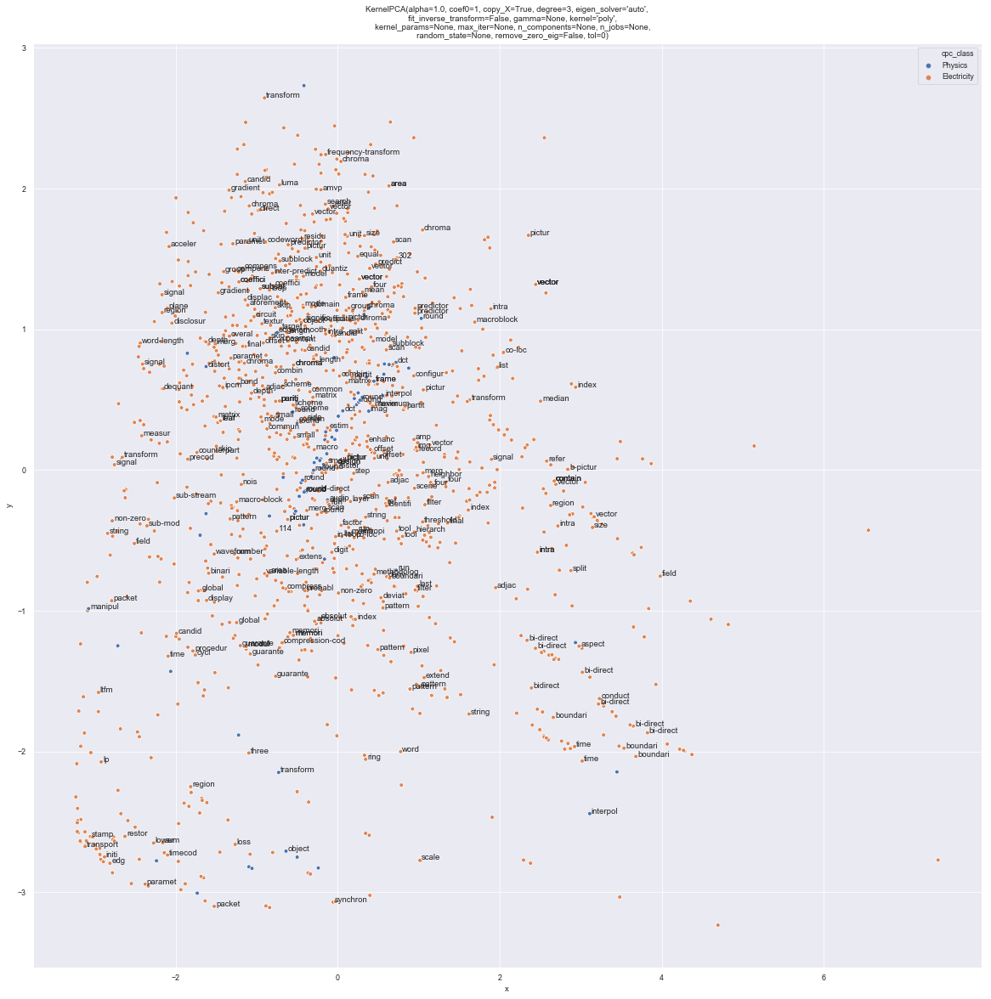

In [64]:
ev64_poly_pca.plot_embeddings(detailed=True)

In [65]:
ev300_poly_pca = EmbeddingVisualizer(poly_pca, average_word_seed, patents_seed)

Fit  KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
     fit_inverse_transform=False, gamma=None, kernel='poly',
     kernel_params=None, max_iter=None, n_components=None, n_jobs=None,
     random_state=None, remove_zero_eig=False, tol=0)
EmbeddingVisualizer initialized


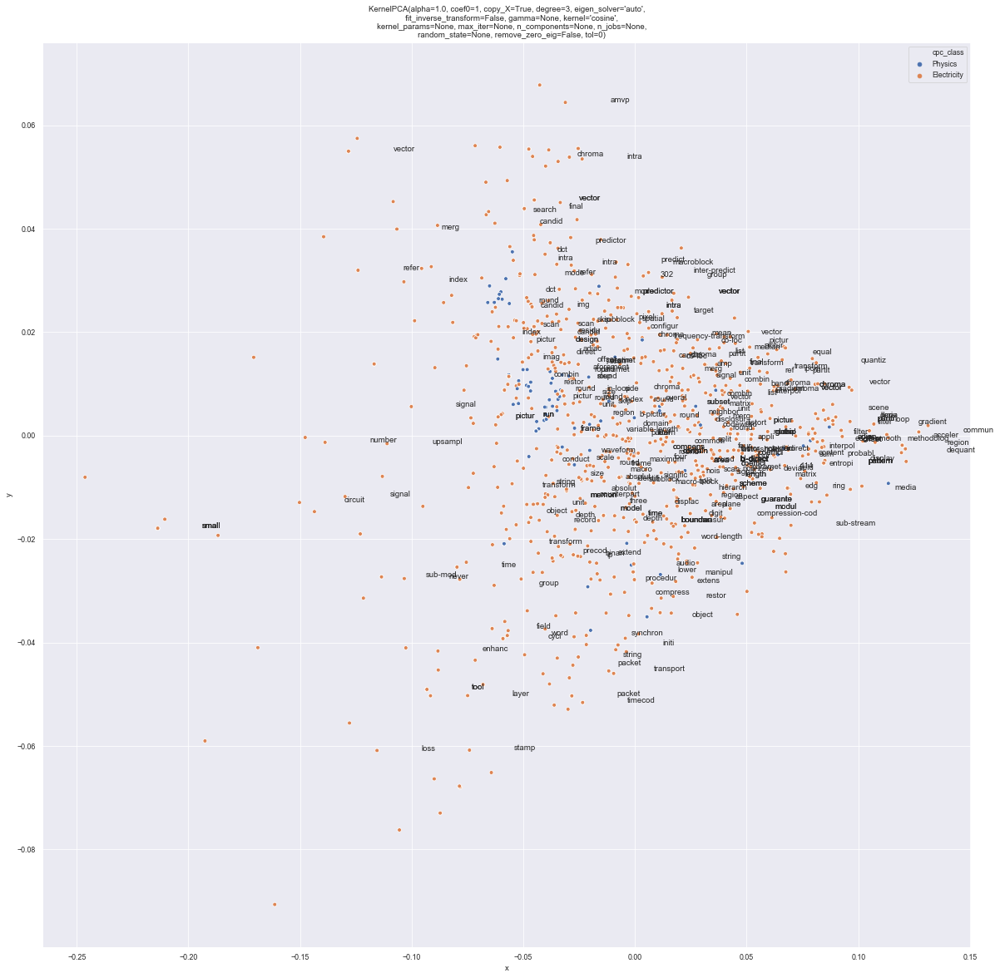

In [66]:
ev300_cosine_pca.plot_embeddings(detailed=True)

#### SVD

In [67]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD()

In [68]:
ev64_svd = EmbeddingVisualizer(svd, final_layer_seed, patents_seed)

Fit  TruncatedSVD(algorithm='randomized', n_components=2, n_iter=5,
       random_state=None, tol=0.0)
EmbeddingVisualizer initialized


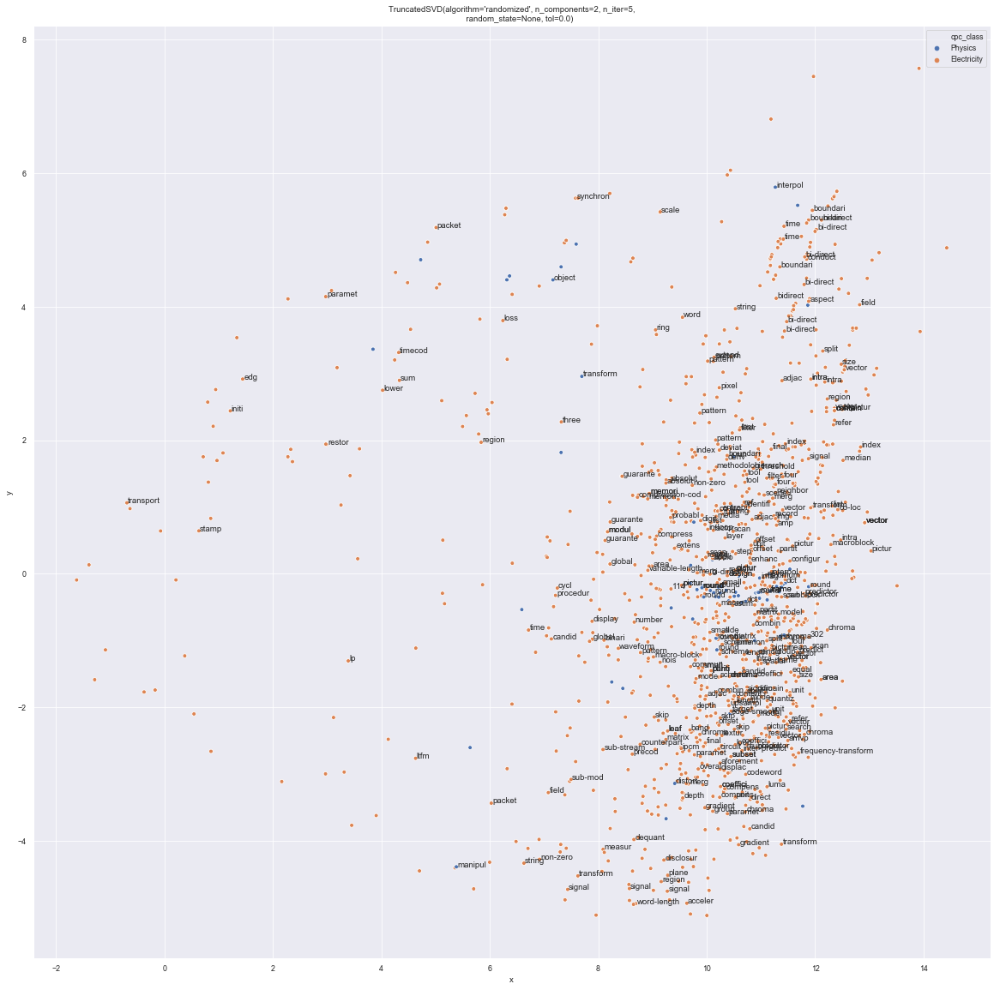

In [69]:
ev64_svd.plot_embeddings(detailed=True)

In [70]:
ev300_svd = EmbeddingVisualizer(svd, average_word_seed, patents_seed)

Fit  TruncatedSVD(algorithm='randomized', n_components=2, n_iter=5,
       random_state=None, tol=0.0)
EmbeddingVisualizer initialized


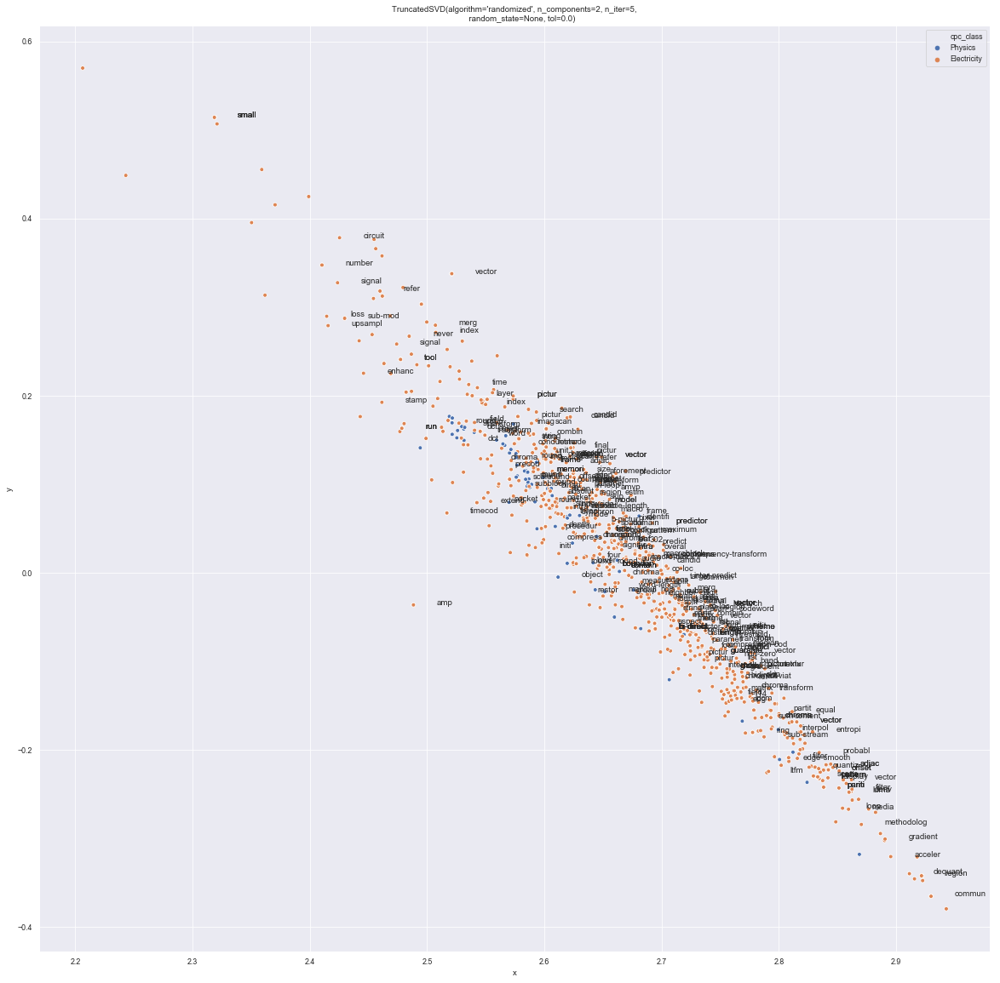

In [71]:
ev300_svd.plot_embeddings(detailed=True)